# **0. Load Preliminary Functions**

# a. Import Libraries and Functions

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from torchvision import datasets
from torchvision import models
from torchvision import transforms
from torch.autograd import Variable

import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from mpl_toolkits.mplot3d import Axes3D
from tqdm.notebook import tqdm
import numpy as np
import pickle
import itertools
import math


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


# b. MNIST Data Loader

In [ ]:
tensor_transform = transforms.Compose([
    transforms.ToTensor()
])

batch_size = 256
train_dataset = datasets.MNIST(root = "./data",
									train = True,
									download = True,
									transform = tensor_transform)
test_dataset = datasets.MNIST(root = "./data",
									train = False,
									download = True,
									transform = tensor_transform)

train_loader = torch.utils.data.DataLoader(dataset = train_dataset,
							   batch_size = batch_size,
								 shuffle = True)
test_loader = torch.utils.data.DataLoader(dataset = test_dataset,
							   batch_size = batch_size,
								 shuffle = False)


100%|██████████| 9.91M/9.91M [00:00<00:00, 16.8MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 500kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 4.70MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 6.42MB/s]


# **1. DDPM**


# a. Building Blocks

In [ ]:
class ResidualConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.same_channels = in_channels==out_channels
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1),
            nn.BatchNorm2d(out_channels),
            nn.GELU(),
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_channels, out_channels, 3, 1, 1),
            nn.BatchNorm2d(out_channels),
            nn.GELU(),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
          x1 = self.conv1(x)
          x2 = self.conv2(x1)
          if self.same_channels:
              out = x + x2
          else:
              out = x1 + x2
          return out / 1.414


class UnetDown(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UnetDown, self).__init__()
        layers = [ResidualConvBlock(in_channels, out_channels), nn.MaxPool2d(2)]
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)


class UnetUp(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UnetUp, self).__init__()
        layers = [
            nn.ConvTranspose2d(in_channels, out_channels, 2, 2),
            ResidualConvBlock(out_channels, out_channels),
            ResidualConvBlock(out_channels, out_channels),
        ]
        self.model = nn.Sequential(*layers)

    def forward(self, x, skip):
        x = torch.cat((x, skip), 1)
        x = self.model(x)
        return x


class EmbedFC(nn.Module):
    def __init__(self, input_dim, emb_dim):
        super(EmbedFC, self).__init__()
        self.input_dim = input_dim
        layers = [
            nn.Linear(input_dim, emb_dim),
            nn.GELU(),
            nn.Linear(emb_dim, emb_dim),
        ]
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        x = x.view(-1, self.input_dim)
        return self.model(x)


class ContextUnet(nn.Module):
    def __init__(self, in_channels, n_feat = 256, n_classes=10):
        super(ContextUnet, self).__init__()

        self.in_channels = in_channels
        self.n_feat = n_feat
        self.n_classes = n_classes

        self.init_conv = ResidualConvBlock(in_channels, n_feat)

        self.down1 = UnetDown(n_feat, n_feat)
        self.down2 = UnetDown(n_feat, 2 * n_feat)

        self.to_vec = nn.Sequential(nn.AvgPool2d(7), nn.GELU())

        self.timeembed1 = EmbedFC(1, 2*n_feat)
        self.timeembed2 = EmbedFC(1, 1*n_feat)
        self.contextembed1 = EmbedFC(n_classes, 2*n_feat)
        self.contextembed2 = EmbedFC(n_classes, 1*n_feat)

        self.up0 = nn.Sequential(
            nn.ConvTranspose2d(2 * n_feat, 2 * n_feat, 7, 7),
            nn.GroupNorm(8, 2 * n_feat),
            nn.ReLU(),
        )

        self.up1 = UnetUp(4 * n_feat, n_feat)
        self.up2 = UnetUp(2 * n_feat, n_feat)
        self.out = nn.Sequential(
            nn.Conv2d(2 * n_feat, n_feat, 3, 1, 1),
            nn.GroupNorm(8, n_feat),
            nn.ReLU(),
            nn.Conv2d(n_feat, self.in_channels, 3, 1, 1),
        )

    def forward(self, x, c, t, context_mask):
        x = self.init_conv(x)
        down1 = self.down1(x)
        down2 = self.down2(down1)
        hiddenvec = self.to_vec(down2)

        c = nn.functional.one_hot(c, num_classes=self.n_classes).type(torch.float)

        context_mask = context_mask[:, None]
        context_mask = context_mask.repeat(1,self.n_classes)
        # context_mask = (-1*(1-context_mask)) # need to flip 0 <-> 1
        c = c * context_mask

        cemb1 = self.contextembed1(c).view(-1, self.n_feat * 2, 1, 1)
        temb1 = self.timeembed1(t).view(-1, self.n_feat * 2, 1, 1)
        cemb2 = self.contextembed2(c).view(-1, self.n_feat, 1, 1)
        temb2 = self.timeembed2(t).view(-1, self.n_feat, 1, 1)

        up1 = self.up0(hiddenvec)
        up2 = self.up1(cemb1*up1+ temb1, down2)
        up3 = self.up2(cemb2*up2+ temb2, down1)
        out = self.out(torch.cat((up3, x), 1))
        return out

# b. DDPM Schedules

In [ ]:
def ddpm_schedules(beta1, beta2, T):
    assert beta1 < beta2 < 1.0, "beta1 and beta2 must be in (0, 1)"

    alpha_t = 0.0
    oneover_sqrta = 0.0
    sqrt_beta_t = 0.0
    alphabar_t= 0.0
    sqrtab = 0.0
    sqrtmab = 0.0
    mab_over_sqrtmab_inv  = 0.0
    ##################
    ### Problem 1 (a): Implement ddpm_schedules()
    ##################
    ##################
    betas = torch.linspace(beta1, beta2, T)
    alpha_t = 1 - betas
    oneover_sqrta = 1 / torch.sqrt(alpha_t)
    sqrt_beta_t = torch.sqrt(betas)
    alphabar_t = torch.cumprod(alpha_t, dim=0)
    sqrtab = torch.sqrt(alphabar_t)
    sqrtmab = torch.sqrt(1 - alphabar_t)
    mab_over_sqrtmab_inv = (1 - alpha_t) / sqrtmab
    return {
        "alpha_t": alpha_t,  # \alpha_t
        "oneover_sqrta": oneover_sqrta,  # 1/\sqrt{\alpha_t}
        "sqrt_beta_t": sqrt_beta_t,  # \sqrt{\beta_t}
        "alphabar_t": alphabar_t,  # \bar{\alpha_t}
        "sqrtab": sqrtab,  # \sqrt{\bar{\alpha_t}}
        "sqrtmab": sqrtmab,  # \sqrt{1-\bar{\alpha_t}}
        "mab_over_sqrtmab": mab_over_sqrtmab_inv,  # (1-\alpha_t)/\sqrt{1-\bar{\alpha_t}}
    }

# c. DDPM Main Module



In [ ]:
class DDPM(nn.Module):
    def __init__(self, nn_model, betas, n_T, device, drop_prob=0.1):
        super(DDPM, self).__init__()
        self.nn_model = nn_model.to(device)

        for k, v in ddpm_schedules(betas[0], betas[1], n_T).items():
            self.register_buffer(k, v)

        self.n_T = n_T
        self.device = device
        self.drop_prob = drop_prob
        self.loss_mse = nn.MSELoss()

    def forward(self, x, c):
        ##################
        ### Problem 1 (b): Implement ddpm_schedules()
        ##################
        ##################
        t = torch.randint(0, self.n_T, (x.shape[0], ), device=self.device)
        e = torch.randn_like(x, device=self.device)
        sqrtab_t = self.sqrtab[t, None, None, None]
        sqrtmab_t = self.sqrtmab[t, None, None, None]
        x_t = sqrtab_t * x + sqrtmab_t * e
        if self.drop_prob > 0:
            context_mask = (torch.rand(x.shape[0], device=self.device) > self.drop_prob).to(x.dtype)
        else:
            context_mask = torch.ones(x.shape[0], device=self.device)
        t = t.to(torch.float32)
        predict_noise = self.nn_model.forward(x_t, c, t, context_mask)
        loss = self.loss_mse(predict_noise, e)
        # oneover_sqrta = self.oneover_sqrta[t, None, None, None]
        # mab_over_sqrtmab = self.mab_over_sqrtmab[t, None, None, None]
        # mab_over_sqrtmab = self.sqrt_beta_t[t, None, None, None]
        # x_t_min_1 = oneover_sqrta * (x_t - self.mab_over_sqrtmab[t] * predict_noise) + torch.randn_like(x_t) * self.sqrt_beta_t[r_t]
        return loss
    @torch.no_grad()
    def sample(self, n_sample, size, device, steps = None, guide_w=0.0):
        x_i = torch.randn(n_sample, *size).to(device)
        c_i = torch.arange(0, 10).to(device)
        c_i = c_i.repeat(n_sample // c_i.shape[0])

        context_mask = torch.zeros_like(c_i).to(device)

        c_i = c_i.repeat(2)
        context_mask = context_mask.repeat(2)
        context_mask[n_sample:] = 1.0  # second half context-free
        if steps == None:
            steps = self.n_T
        for i in range(steps, 0, -1):
            i -= 1
            print(f'Sampling timestep {i}', end='\r')
            oneover_sqrta = self.oneover_sqrta[i, None, None, None]
            mab_over_sqrtmab = self.mab_over_sqrtmab[i ,None, None, None]
            sqrt_beta_t = self.sqrt_beta_t[i, None, None, None]
            T = torch.tensor(i).repeat(n_sample).to(device, torch.float32)
            if guide_w == 0:
                predict_noise = self.nn_model.forward(x_i, c_i[:n_sample], T, context_mask[:n_sample])
            else:
                predict_noise_unguide = self.nn_model.forward(x_i, c_i[:n_sample], T, context_mask[:n_sample])
                predict_noise = self.nn_model.forward(x_i, c_i[n_sample:], T, context_mask[n_sample:])
                predict_noise = predict_noise_unguide + guide_w * (predict_noise - predict_noise_unguide)
            if i > 1:
                x_i = oneover_sqrta * (x_i - mab_over_sqrtmab * predict_noise) + torch.randn_like(x_i) * sqrt_beta_t
            else:
                x_i = oneover_sqrta * (x_i - mab_over_sqrtmab * predict_noise)
            ##################
            ### Problem 1 (b): Implement ddpm_schedules()
            ##################
            ##################
        return x_i


# c. Training Function

In [ ]:
def train_main_loop(ddpm, optim, dataloader, lr,
                    ws_test, n_epoch, batch_size, sample_steps = None):
    for ep in range(n_epoch):
        print(f'epoch {ep}')
        ddpm.train()

        # linear lrate decay
        optim.param_groups[0]['lr'] = lr*(1-ep/n_epoch)

        pbar = tqdm(dataloader)
        loss_ema = None
        # train
        for x, c in pbar:
            optim.zero_grad()
            x = x.to(device)
            c = c.to(device)
            loss = ddpm(x, c)
            loss.backward()
            if loss_ema is None:
                loss_ema = loss.item()
            else:
                loss_ema = 0.95 * loss_ema + 0.05 * loss.item()
            pbar.set_description(f"loss: {loss_ema:.4f}")
            optim.step()

        # eval
        ddpm.eval()
        with torch.no_grad():
            n_sample = 20
            for w_i, w in enumerate(ws_test):
                x_gen = ddpm.sample(n_sample, (1, 28, 28), device, sample_steps, guide_w=w)
            # samples_per_w = n_sample // len(ws_test)
            # all_generated_samples = []
            # for w_i, w in enumerate(ws_test):
            #     # 每次只采样 `samples_per_w` 个样本, 加速采样时间
            #     x_gen_batch = ddpm.sample(samples_per_w, (1, 28, 28), device, guide_w=w)
            #     all_generated_samples.append(x_gen_batch)
            # x_gen = torch.cat(all_generated_samples, dim=0)
            fig, ax = plt.subplots(5, 4, figsize=(6, 6))
            for i, j in itertools.product(range(5), range(4)):
                ax[i,j].get_xaxis().set_visible(False)
                ax[i,j].get_yaxis().set_visible(False)

            for k in range(n_sample):
                i = k//4
                j = k%4
                ax[i,j].cla()
                ax[i,j].imshow(x_gen[k,:].data.cpu().numpy().reshape(28, 28), cmap='Greys')
            plt.show()

        if ep == n_epoch - 1:
          plt.savefig('final_generated_samples.png', bbox_inches='tight')


# e. Training


In [ ]:
# # hardcoding these here
# n_epoch = 20
# n_T = 400
# n_feat = 128
# lr = 1e-4
# ws_test = [0.0, 0.5, 2.0]

# ddpm = DDPM(nn_model=ContextUnet(in_channels=1, n_feat=n_feat, n_classes=10), betas=(1e-4, 0.02), n_T=n_T, device=device, drop_prob=0.1)
# ddpm.to(device)

# tf = transforms.Compose([transforms.ToTensor()]) # mnist is already normalised 0 to 1

# optim = torch.optim.Adam(ddpm.parameters(), lr=lr)
# train_main_loop(ddpm, optim, train_loader, lr, ws_test, n_epoch, batch_size)


# **2. Ablation Study**

In [ ]:
##################
### Problem 2: Ablation Study
##################

In [ ]:
# # 1. n_T set to 2000
# n_epoch = 20
# n_T = 2000
# n_feat = 128
# lr = 1e-4
# ws_test = [0.0, 0.5, 2.0]


# ddpm = DDPM(nn_model=ContextUnet(in_channels=1, n_feat=n_feat, n_classes=10), betas=(1e-4, 0.02), n_T=n_T, device=device, drop_prob=0.1)
# ddpm.to(device)

# tf = transforms.Compose([transforms.ToTensor()]) # mnist is already normalised 0 to 1

# optim = torch.optim.Adam(ddpm.parameters(), lr=lr)
# train_main_loop(ddpm, optim, train_loader, lr, ws_test, n_epoch, batch_size)

epoch 0


  0%|          | 0/235 [00:00<?, ?it/s]

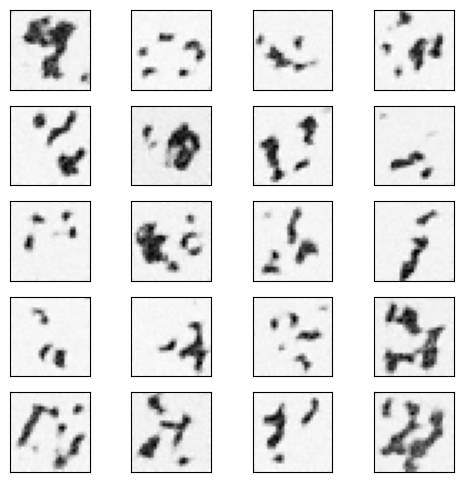

epoch 1


  0%|          | 0/235 [00:00<?, ?it/s]

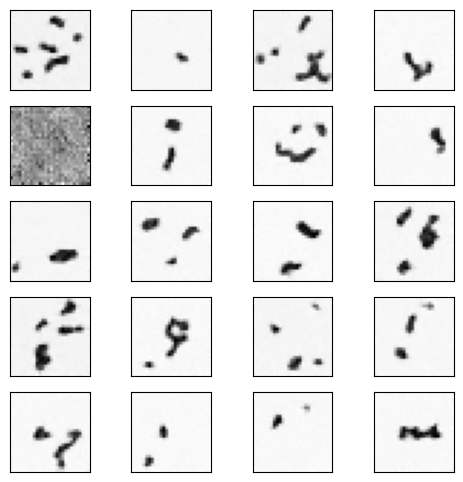

epoch 2


  0%|          | 0/235 [00:00<?, ?it/s]

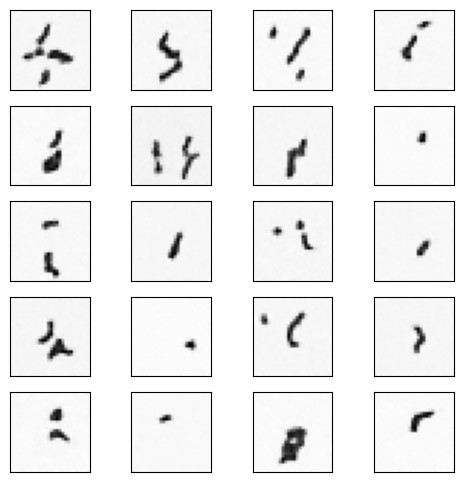

epoch 3


  0%|          | 0/235 [00:00<?, ?it/s]

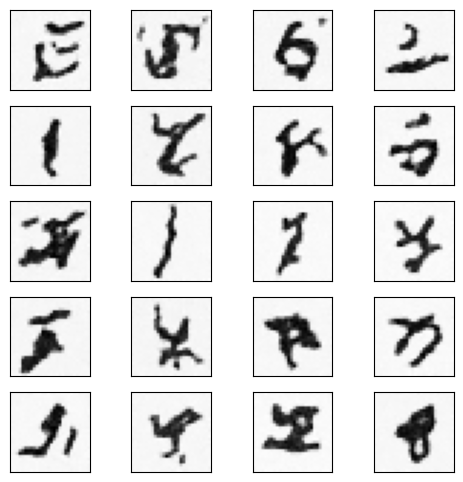

epoch 4


  0%|          | 0/235 [00:00<?, ?it/s]

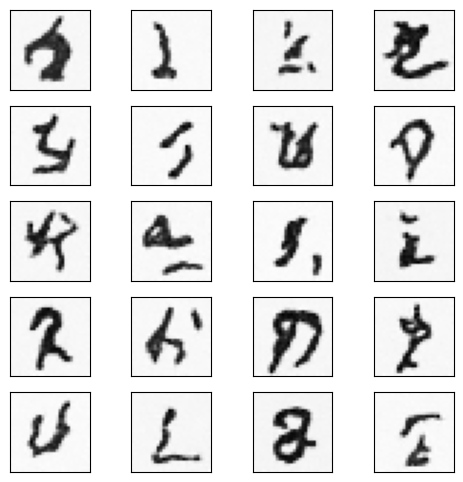

epoch 5


  0%|          | 0/235 [00:00<?, ?it/s]

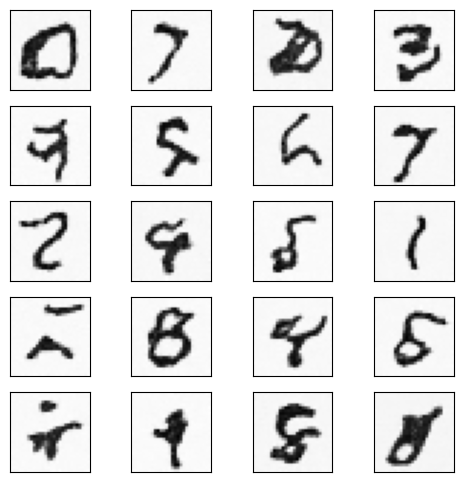

epoch 6


  0%|          | 0/235 [00:00<?, ?it/s]

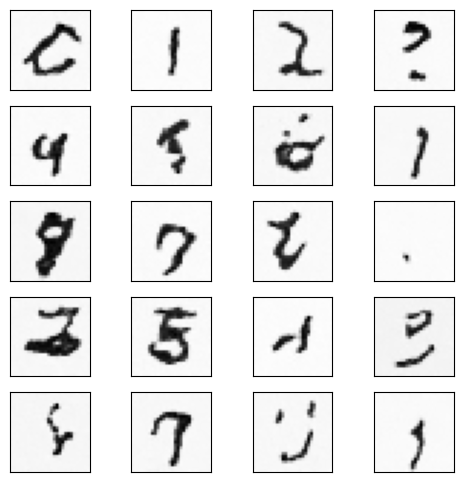

epoch 7


  0%|          | 0/235 [00:00<?, ?it/s]

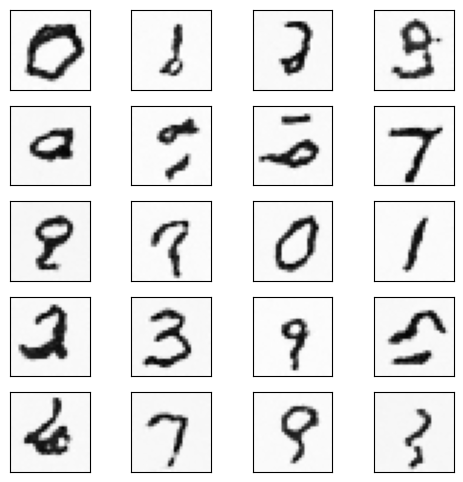

epoch 8


  0%|          | 0/235 [00:00<?, ?it/s]

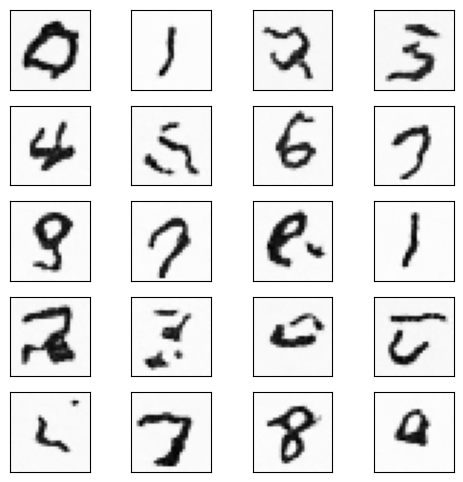

epoch 9


  0%|          | 0/235 [00:00<?, ?it/s]

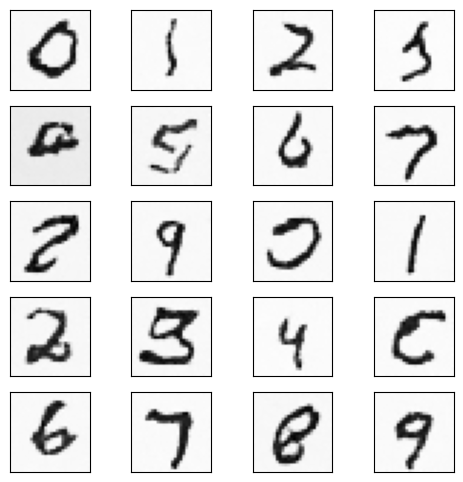

epoch 10


  0%|          | 0/235 [00:00<?, ?it/s]

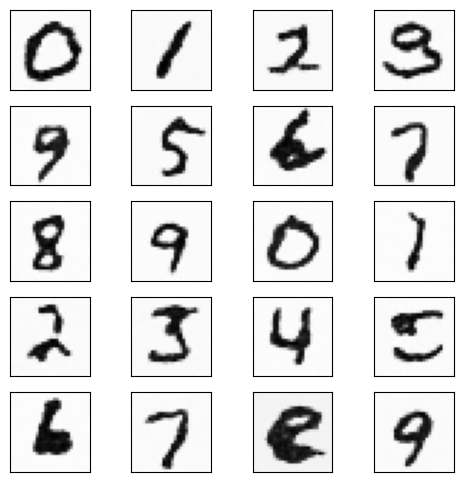

epoch 11


  0%|          | 0/235 [00:00<?, ?it/s]

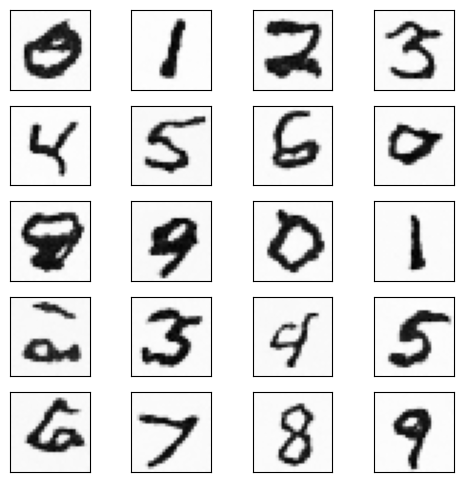

epoch 12


  0%|          | 0/235 [00:00<?, ?it/s]

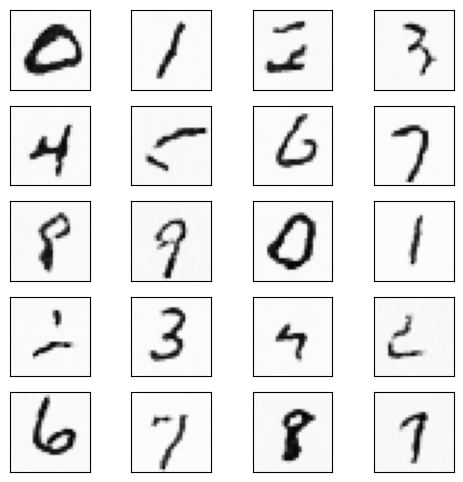

epoch 13


  0%|          | 0/235 [00:00<?, ?it/s]

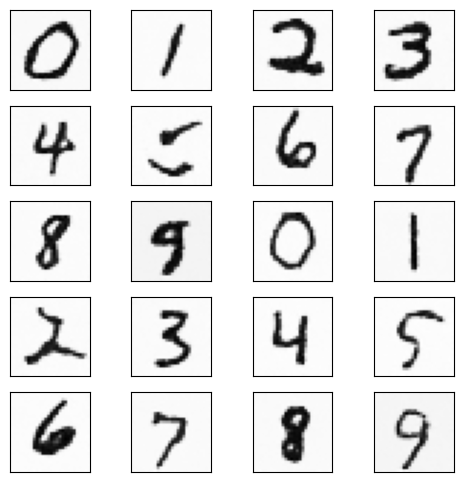

epoch 14


  0%|          | 0/235 [00:00<?, ?it/s]

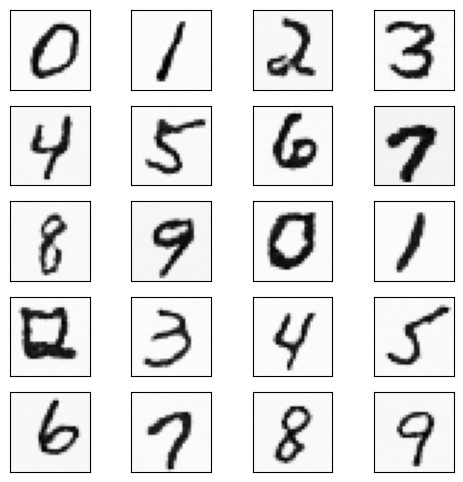

epoch 15


  0%|          | 0/235 [00:00<?, ?it/s]

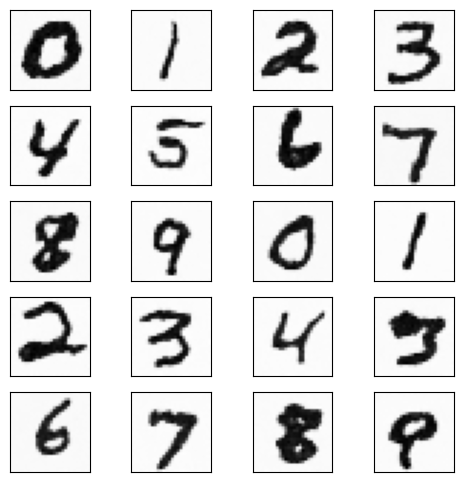

epoch 16


  0%|          | 0/235 [00:00<?, ?it/s]

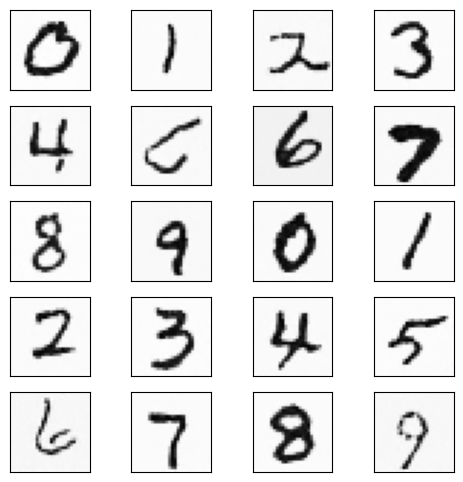

epoch 17


  0%|          | 0/235 [00:00<?, ?it/s]

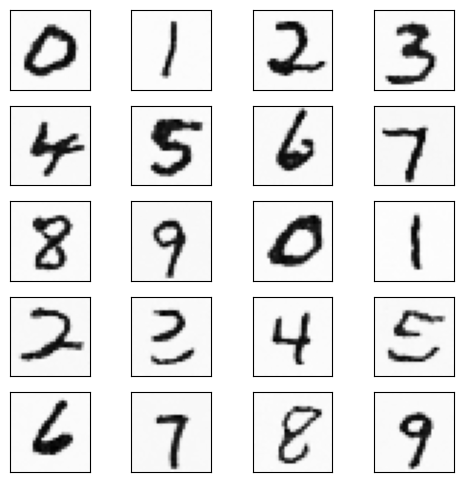

epoch 18


  0%|          | 0/235 [00:00<?, ?it/s]

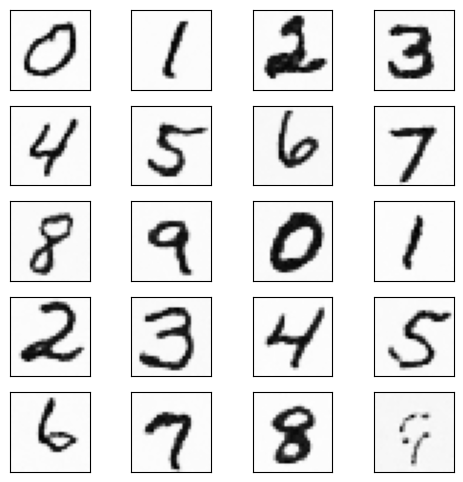

epoch 19


  0%|          | 0/235 [00:00<?, ?it/s]

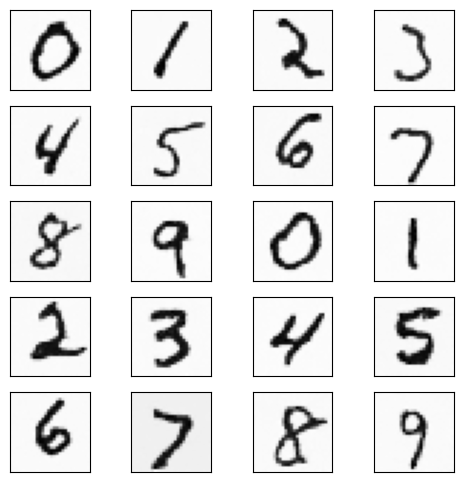

<Figure size 640x480 with 0 Axes>

In [ ]:
# 2. n_T set to 500
n_epoch = 20
n_T = 500
n_feat = 128
lr = 1e-4
# ws_test = [0.0, 0.5, 2.0]
ws_test = [0.0, 0.5, 1.0, 1.5, 2.0]

ddpm = DDPM(nn_model=ContextUnet(in_channels=1, n_feat=n_feat, n_classes=10), betas=(1e-4, 0.02), n_T=n_T, device=device, drop_prob=0.1)
ddpm.to(device)

tf = transforms.Compose([transforms.ToTensor()]) # mnist is already normalised 0 to 1

optim = torch.optim.Adam(ddpm.parameters(), lr=lr)
train_main_loop(ddpm, optim, train_loader, lr, ws_test, n_epoch, batch_size, None)

epoch 0


  0%|          | 0/235 [00:00<?, ?it/s]

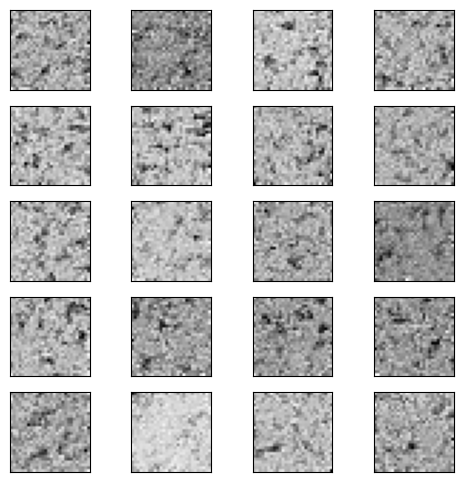

epoch 1


  0%|          | 0/235 [00:00<?, ?it/s]

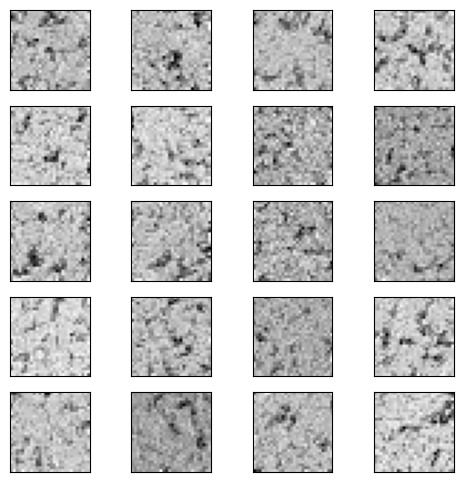

epoch 2


  0%|          | 0/235 [00:00<?, ?it/s]

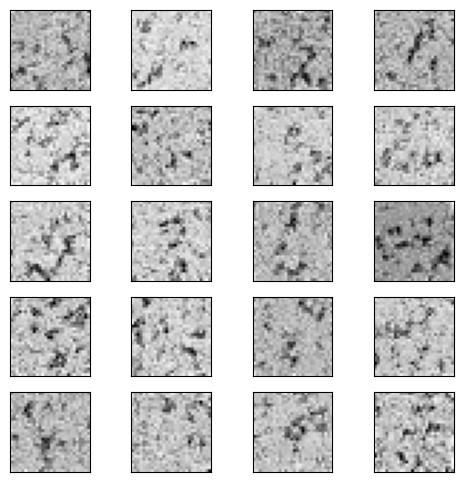

epoch 3


  0%|          | 0/235 [00:00<?, ?it/s]

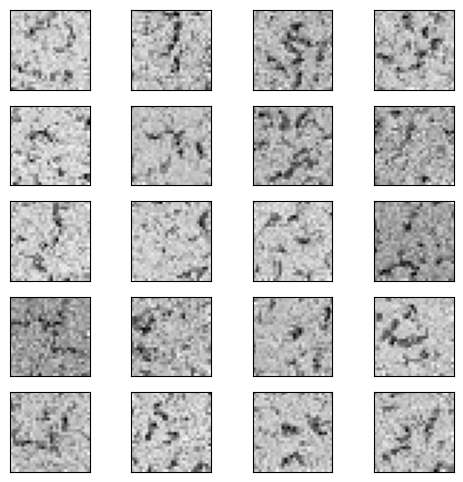

epoch 4


  0%|          | 0/235 [00:00<?, ?it/s]

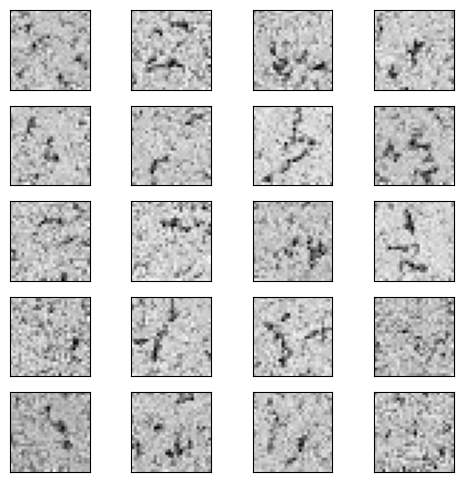

epoch 5


  0%|          | 0/235 [00:00<?, ?it/s]

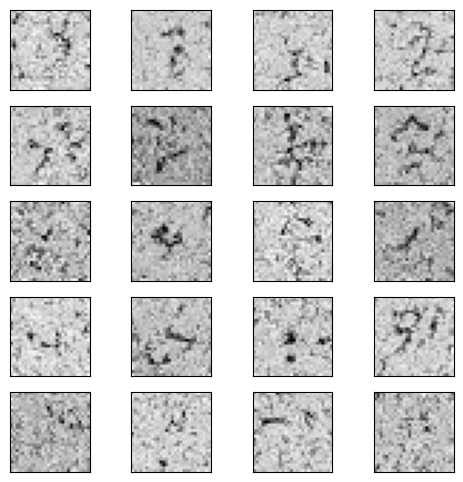

epoch 6


  0%|          | 0/235 [00:00<?, ?it/s]

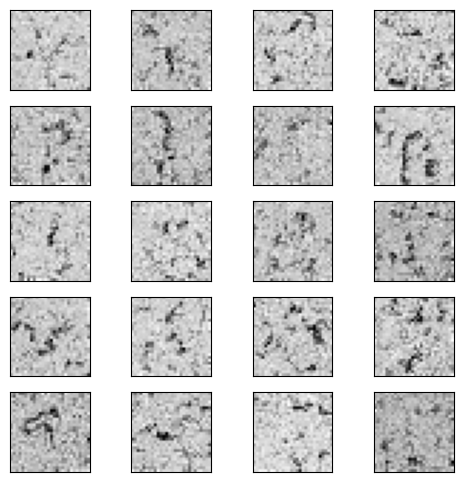

epoch 7


  0%|          | 0/235 [00:00<?, ?it/s]

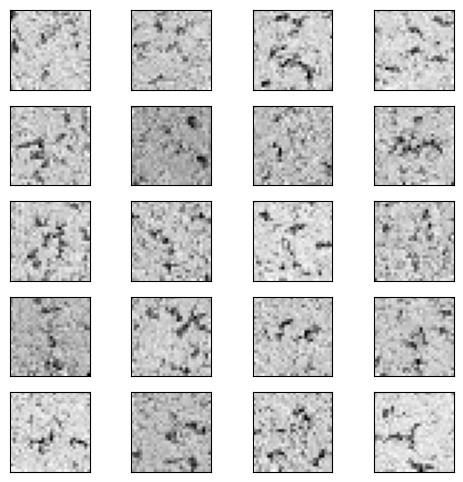

epoch 8


  0%|          | 0/235 [00:00<?, ?it/s]

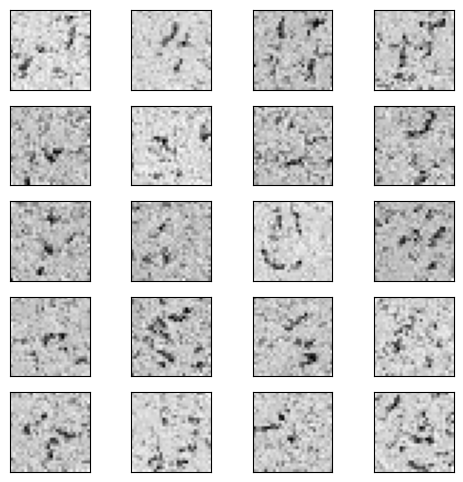

epoch 9


  0%|          | 0/235 [00:00<?, ?it/s]

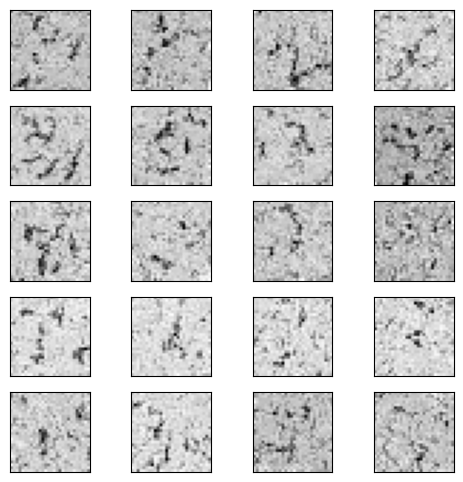

epoch 10


  0%|          | 0/235 [00:00<?, ?it/s]

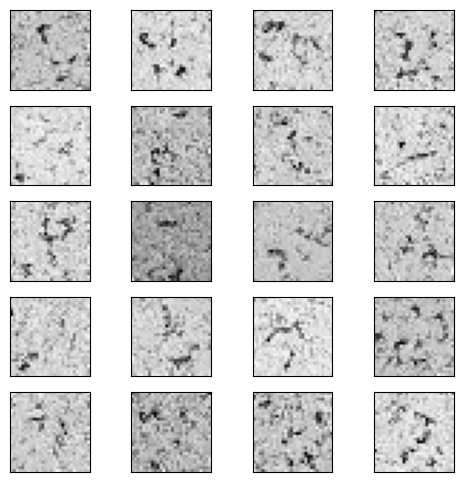

epoch 11


  0%|          | 0/235 [00:00<?, ?it/s]

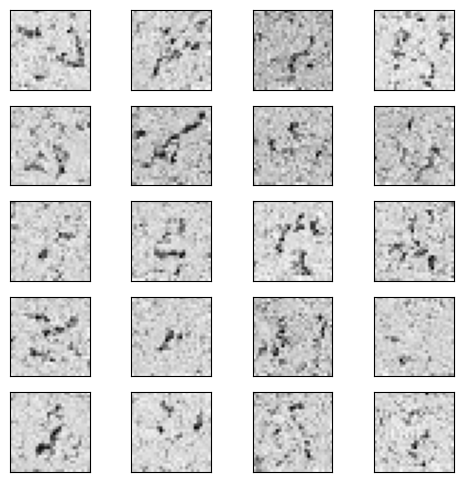

epoch 12


  0%|          | 0/235 [00:00<?, ?it/s]

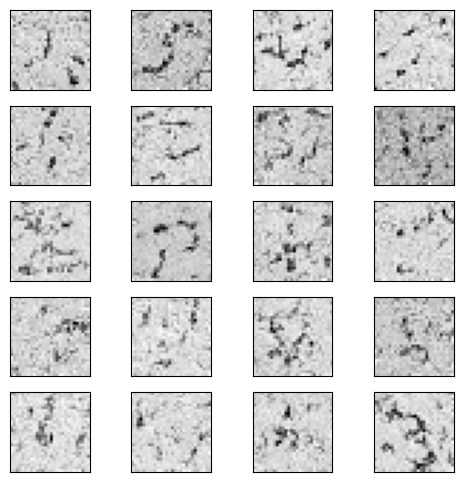

epoch 13


  0%|          | 0/235 [00:00<?, ?it/s]

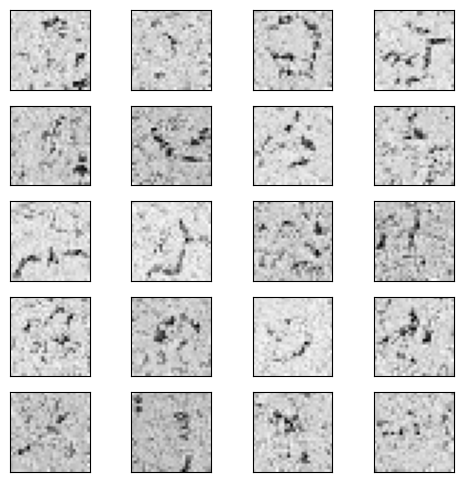

epoch 14


  0%|          | 0/235 [00:00<?, ?it/s]

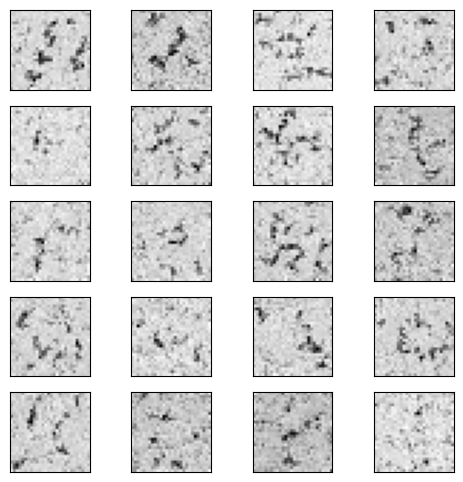

epoch 15


  0%|          | 0/235 [00:00<?, ?it/s]

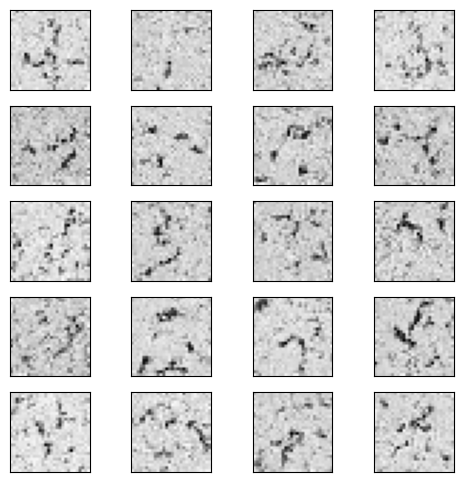

epoch 16


  0%|          | 0/235 [00:00<?, ?it/s]

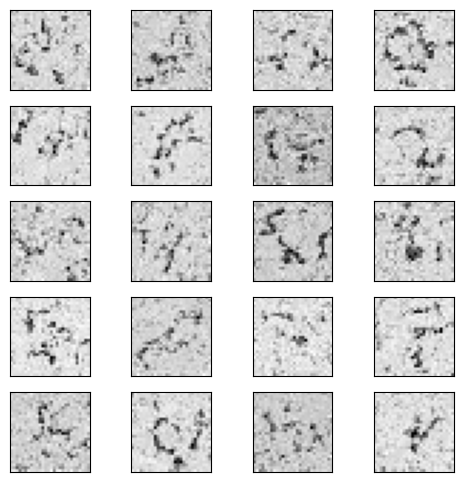

epoch 17


  0%|          | 0/235 [00:00<?, ?it/s]

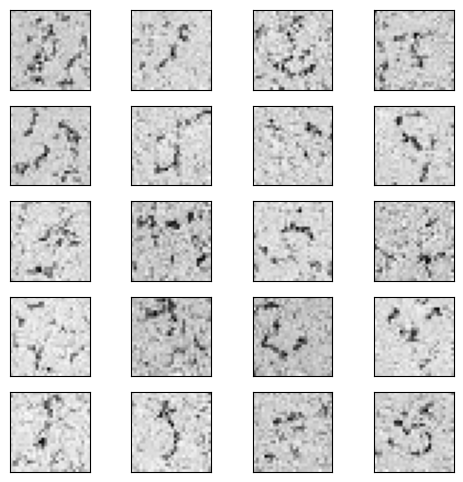

epoch 18


  0%|          | 0/235 [00:00<?, ?it/s]

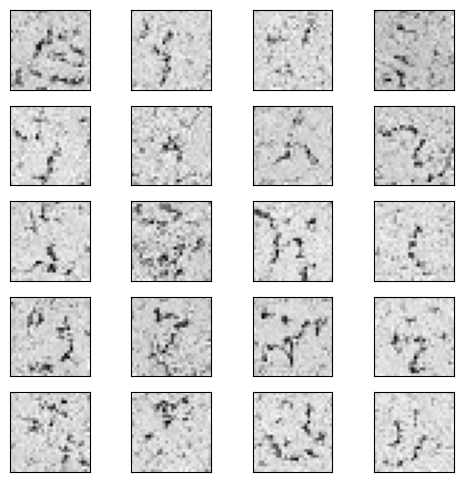

epoch 19


  0%|          | 0/235 [00:00<?, ?it/s]

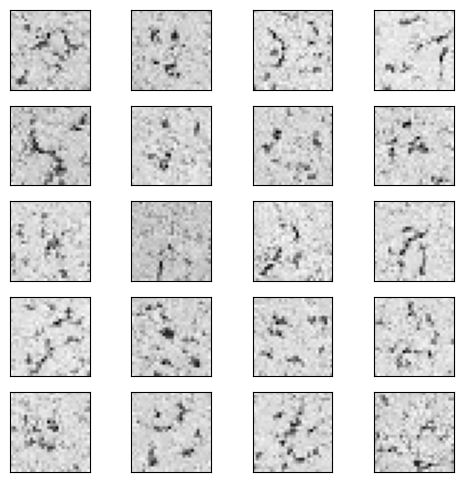

<Figure size 640x480 with 0 Axes>

In [ ]:
# 3. sample steps set to 50
n_epoch = 20
n_T = 500
n_feat = 128
lr = 1e-4
ws_test = [0.0, 0.5, 2.0]

ddpm = DDPM(nn_model=ContextUnet(in_channels=1, n_feat=n_feat, n_classes=10), betas=(1e-4, 0.02), n_T=n_T, device=device, drop_prob=0.1)
ddpm.to(device)

tf = transforms.Compose([transforms.ToTensor()]) # mnist is already normalised 0 to 1

optim = torch.optim.Adam(ddpm.parameters(), lr=lr)
train_main_loop(ddpm, optim, train_loader, lr, ws_test, n_epoch, batch_size, 50)

epoch 0


  0%|          | 0/235 [00:00<?, ?it/s]

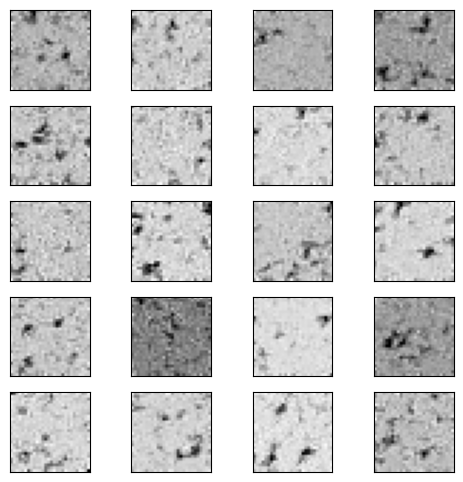

epoch 1


  0%|          | 0/235 [00:00<?, ?it/s]

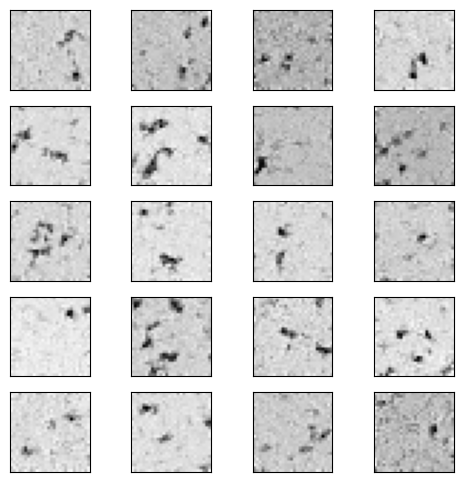

epoch 2


  0%|          | 0/235 [00:00<?, ?it/s]

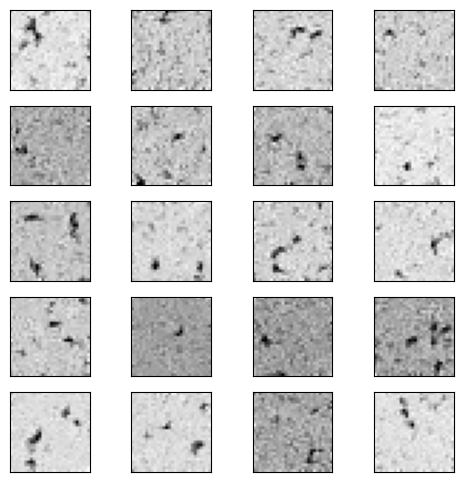

epoch 3


  0%|          | 0/235 [00:00<?, ?it/s]

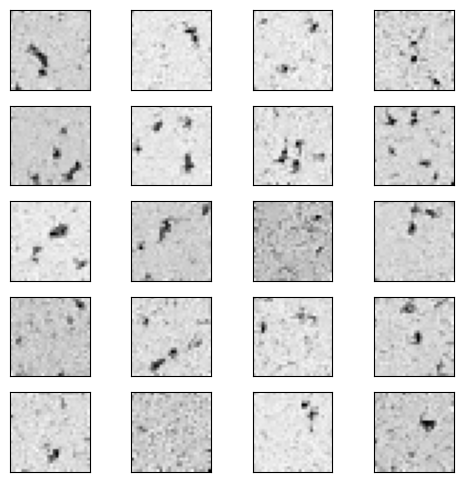

epoch 4


  0%|          | 0/235 [00:00<?, ?it/s]

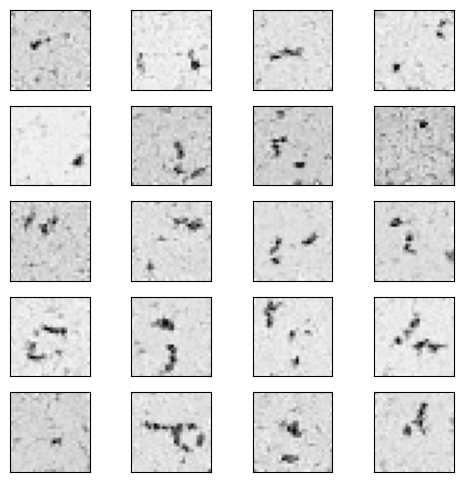

epoch 5


  0%|          | 0/235 [00:00<?, ?it/s]

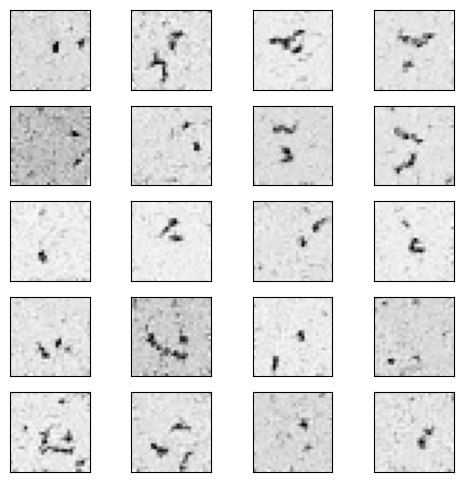

epoch 6


  0%|          | 0/235 [00:00<?, ?it/s]

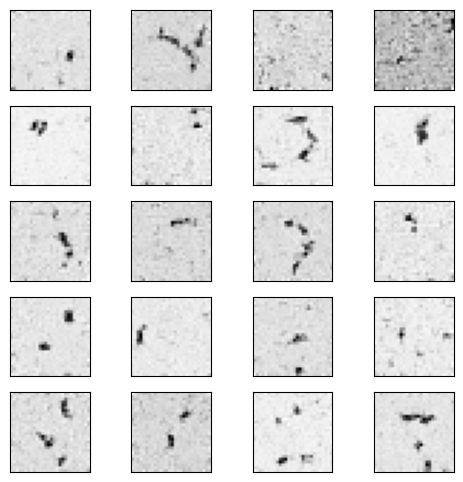

epoch 7


  0%|          | 0/235 [00:00<?, ?it/s]

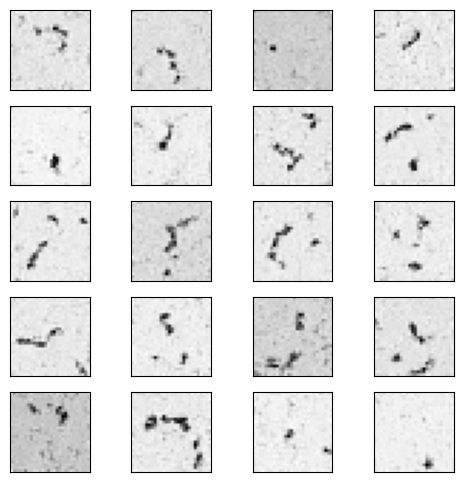

epoch 8


  0%|          | 0/235 [00:00<?, ?it/s]

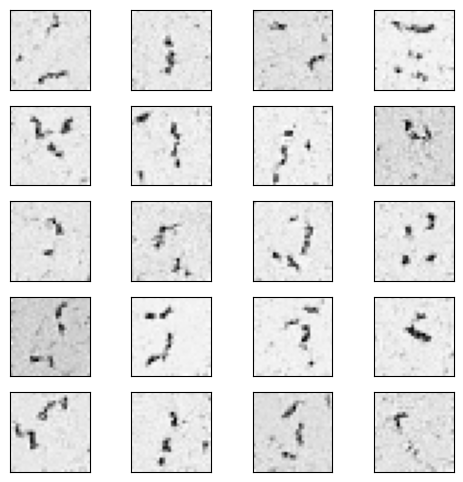

epoch 9


  0%|          | 0/235 [00:00<?, ?it/s]

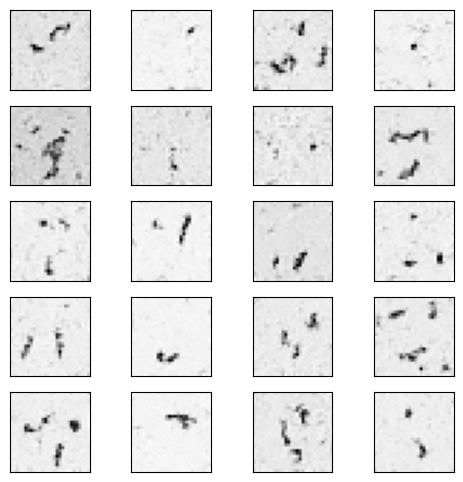

epoch 10


  0%|          | 0/235 [00:00<?, ?it/s]

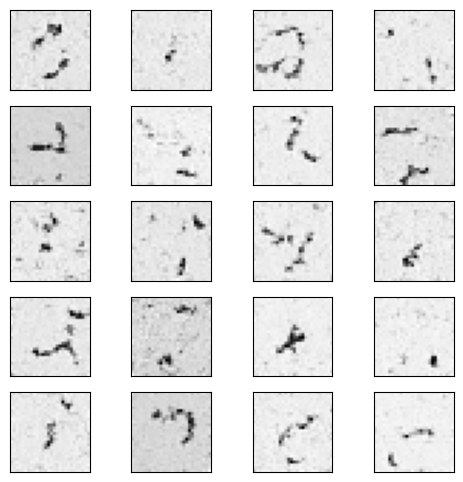

epoch 11


  0%|          | 0/235 [00:00<?, ?it/s]

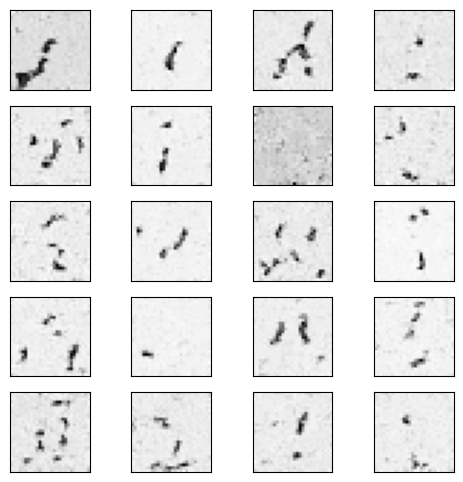

epoch 12


  0%|          | 0/235 [00:00<?, ?it/s]

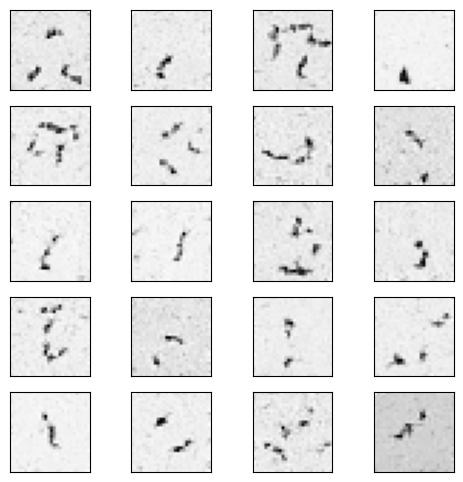

epoch 13


  0%|          | 0/235 [00:00<?, ?it/s]

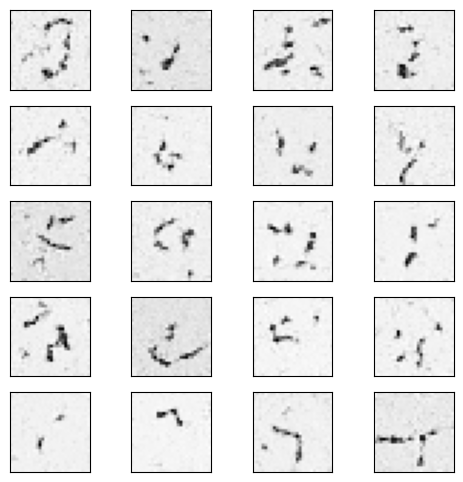

epoch 14


  0%|          | 0/235 [00:00<?, ?it/s]

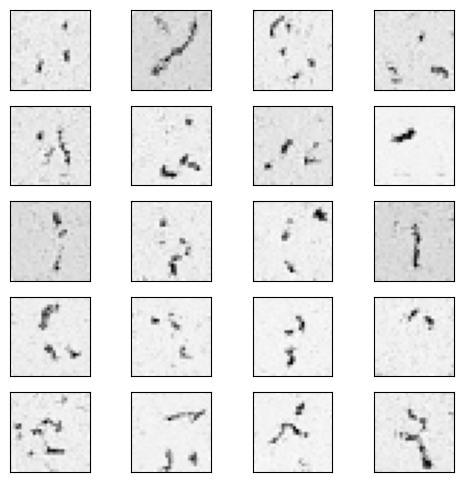

epoch 15


  0%|          | 0/235 [00:00<?, ?it/s]

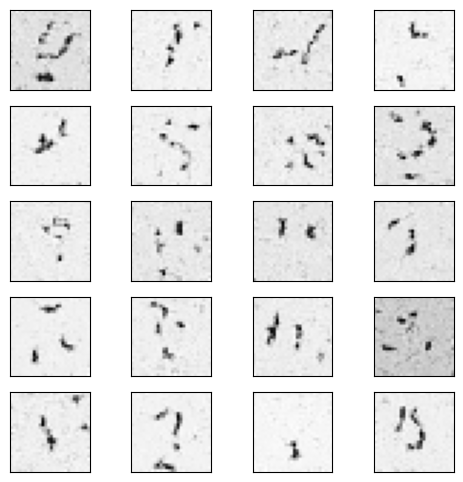

epoch 16


  0%|          | 0/235 [00:00<?, ?it/s]

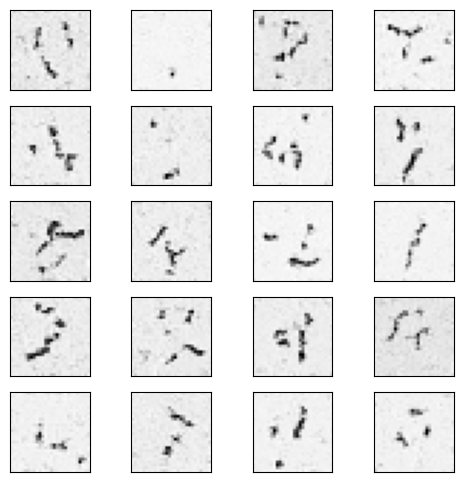

epoch 17


  0%|          | 0/235 [00:00<?, ?it/s]

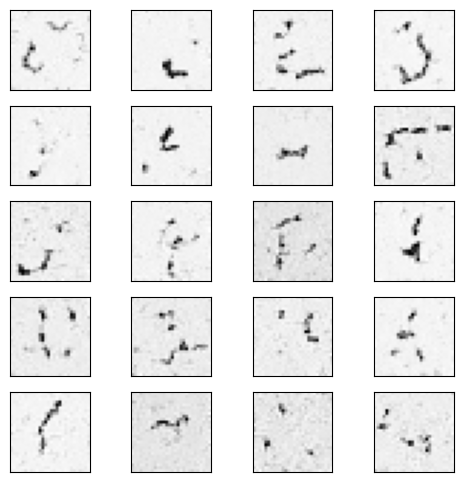

epoch 18


  0%|          | 0/235 [00:00<?, ?it/s]

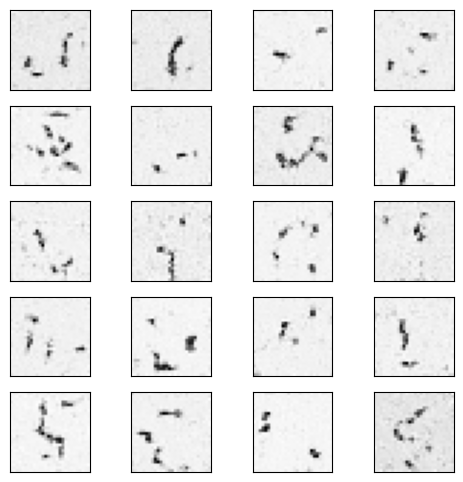

epoch 19


  0%|          | 0/235 [00:00<?, ?it/s]

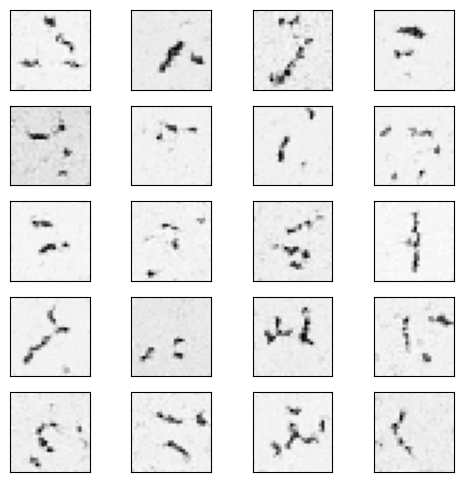

<Figure size 640x480 with 0 Axes>

In [ ]:
# 4. sample steps set to 100
n_epoch = 20
n_T = 1000
n_feat = 128
lr = 1e-4
ws_test = [0.0, 0.5, 2.0]

ddpm = DDPM(nn_model=ContextUnet(in_channels=1, n_feat=n_feat, n_classes=10), betas=(1e-4, 0.02), n_T=n_T, device=device, drop_prob=0.1)
ddpm.to(device)

tf = transforms.Compose([transforms.ToTensor()]) # mnist is already normalised 0 to 1

optim = torch.optim.Adam(ddpm.parameters(), lr=lr)
train_main_loop(ddpm, optim, train_loader, lr, ws_test, n_epoch, batch_size, 100)

# **3. Continuous-time Stochastic Process**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

timesteps = 1000
beta1 = 0.1
beta2 = 50.0
dt = 1.0 / timesteps

means = np.array([0.5, -0.5])
stds = np.array([0.02, 0.02])
weights = np.array([0.5, 0.5])
weights /= np.sum(weights)

n_samples = 100
x_min, x_max = -3, 3
x_grid = np.linspace(x_min, x_max, num=200)

# 预先计算每个 t 的累积 beta 积分: B_cum[t] ≈ ∫₀ᵗ β(s) ds
beta_schedule = np.array([ (i/timesteps)*beta2 + (1-(i/timesteps))*beta1
                           for i in range(timesteps) ])
B_cum = np.cumsum(beta_schedule) * dt

def sample_mixture_gaussian(n_samples):
    # 根据 weights 选出每个样本属于哪个高斯分量
    components = np.random.choice(len(means), size=n_samples, p=weights)
    # 对应分量的均值和方差采样
    samples = np.random.normal(loc=means[components],
                               scale=stds[components])
    return samples

def gaussian_pdf(x, mean, std):
    return (1.0 / (np.sqrt(2 * np.pi) * std)) * np.exp(-0.5 * ((x - mean) / std) ** 2)

def p_xt(x, t):
    """
    计算时刻 t（0 <= t < timesteps）下 x 的混合高斯密度。
    """
    # 当 t=0 时返回初始分布
    if t == 0:
        return np.sum([ weights[i] * gaussian_pdf(x, means[i], stds[i])
                        for i in range(len(means)) ], axis=0)
    # 解的衰减因子和噪声方差
    decay = np.exp(-0.5 * B_cum[t])
    noise_var = 1.0 - np.exp(-B_cum[t])
    
    pdf = np.zeros_like(x)
    for i in range(len(means)):
        m_t = means[i] * decay
        var_t = stds[i]**2 * decay**2 + noise_var
        pdf += weights[i] * gaussian_pdf(x, m_t, np.sqrt(var_t))
    return pdf

def grad_log_p_xt(x, t):
    """
    计算时刻 t 下分数函数 ∇_x log p(x,t)。
    """
    # 当 t=0 时可直接用初始混合分布的分数
    if t == 0:
        p0 = p_xt(x, 0)
        score = np.zeros_like(x)
        for i in range(len(means)):
            mu, sig = means[i], stds[i]
            Ni = weights[i] * gaussian_pdf(x, mu, sig)
            score += Ni * (-(x - mu) / (sig**2))
        return score / (p0 + 1e-12)
    
    decay = np.exp(-0.5 * B_cum[t])
    noise_var = 1.0 - np.exp(-B_cum[t])
    
    # 计算每个分量的 pdf 及其局部梯度
    pis = []
    grads = []
    for i in range(len(means)):
        m_t = means[i] * decay
        var_t = stds[i]**2 * decay**2 + noise_var
        std_t = np.sqrt(var_t)
        Ni = weights[i] * gaussian_pdf(x, m_t, std_t)
        pis.append(Ni)
        grads.append(Ni * (-(x - m_t) / var_t))
    pis = np.stack(pis, axis=0)    # shape (K, len(x))
    grads = np.stack(grads, axis=0)
    
    p_t = np.sum(pis, axis=0)      # 混合密度
    score = np.sum(grads, axis=0)  # 加权梯度之和
    return score / (p_t + 1e-12)

# 其余 forward / backward SDE 保持不变
def forward_sde(timesteps, n_samples, dt):
    x = np.zeros((timesteps, n_samples))
    x_pdf = np.zeros((timesteps, x_grid.shape[0]))

    x0 = sample_mixture_gaussian(n_samples)
    x[0] = x0
    x_pdf[0] = p_xt(x_grid, 0)

    for t in range(1, timesteps):
        noise = np.random.normal(0, 1, size=n_samples)
        x[t] = x[t-1] + f(x[t-1], t) * dt + g(t) * noise * np.sqrt(dt)
        x_pdf[t] = p_xt(x_grid, t)

    return x, x_pdf

def backward_sde(timesteps, n_samples, dt):
    x = np.zeros((timesteps, n_samples))
    xT = np.random.normal(0, 1, size=n_samples)
    x[-1] = xT

    for t in range(timesteps - 1, 0, -1):
        noise = np.random.normal(0, 1, size=n_samples)
        delta_x = (f(x[t], t) - g(t)**2 * grad_log_p_xt(x[t], t)) * dt \
                  + g(t) * noise * np.sqrt(dt)
        x[t-1] = x[t] + delta_x

    return x

# 运行并可视化
forward_x, forward_x_pdf = forward_sde(timesteps, n_samples, dt)
backward_data = backward_sde(timesteps, n_samples, dt)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
for i in range(n_samples):
    axes[0].plot(forward_x[:, i], alpha=0.3)
pcm = axes[0].pcolormesh(np.arange(timesteps), x_grid, forward_x_pdf.T,
                         cmap='viridis', shading='auto')
axes[0].set_title('Forward SDE')

for i in range(n_samples):
    axes[1].plot(backward_data[::-1][:, i], alpha=0.3)
axes[1].set_title('Reverse SDE')

plt.tight_layout()
plt.show()
